In [23]:
import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt
import scipy as sp
import copy
import os

In [24]:
directory = os.getcwd()
df = pd.read_csv(directory+"/results.csv")
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1350 entries, 0 to 1349
Data columns (total 17 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Round_name           1350 non-null   object 
 1   Run_id               1350 non-null   object 
 2   Version              1350 non-null   object 
 3   Total_timespan       1350 non-null   int64  
 4   Total_travel_time    1350 non-null   int64  
 5   Average_travel_Time  1350 non-null   float64
 6   Max_Travel_time      1350 non-null   int64  
 7   Total_#_cars         1350 non-null   int64  
 8   #_finished           1350 non-null   int64  
 9   Deadline Misses      1350 non-null   int64  
 10  Deadline_overTime    1350 non-null   int64  
 11  Time                 1350 non-null   float64
 12  Teleport_Jam         1350 non-null   int64  
 13  Teleport_Yield       1350 non-null   int64  
 14  Teleport_Wrong_Lane  1350 non-null   int64  
 15  #_Collisions         1350 non-null   i

In [27]:
base_name = '4corners_neighborhoods.net.xml-test-'#'4corners_neighborhoods.net.xml-Long_test-'
#'4corners_neighborhoods.net.xml-Nu_test-'
#Braess_Homebrew_fixed.net.xml-Nu_test-'
#Braess_Homebrew_fixed.net.xml-Nu_test-
#data_results=[[0 for _ in range(4)]for _ in range(20)]
criteria = 'Average_travel_Time'#"Deadline Misses" # should literally be called criterion lmao
    
#SUMO Execute = SE, DI = duaIterate
#0 - SE DUE
#1 - SE DSO
#2 - DI DUE
#3 - DI DSO

lst = ['Micro-DUE.9.5', 'Meso-DUE.9.5', 'Macro-DUE.9.5']
range_min = 0
range_max = 5

tests:  4corners_neighborhoods.net.xml-test-
Number of vehicles: -1
Micro-DUE.9.5
Average: 181.14159999999998
minimum: 164.823

Meso-DUE.9.5
Average: 289.8775333333332
minimum: 284.72

Macro-DUE.9.5
Average: 178.5952
minimum: 162.915

tests:  4corners_neighborhoods.net.xml-test-


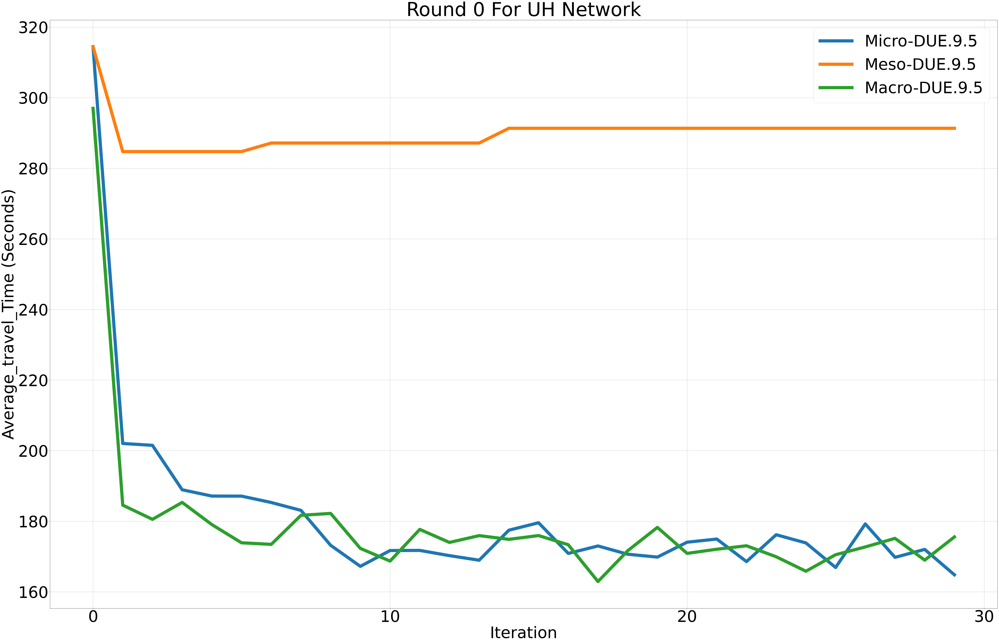

tests:  4corners_neighborhoods.net.xml-test-
Number of vehicles: -1
Micro-DUE.9.5
Average: 195.49133333333333
minimum: 169.567

Meso-DUE.9.5
Average: 314.61433333333315
minimum: 313.757

Macro-DUE.9.5
Average: 191.04080000000005
minimum: 163.238

tests:  4corners_neighborhoods.net.xml-test-


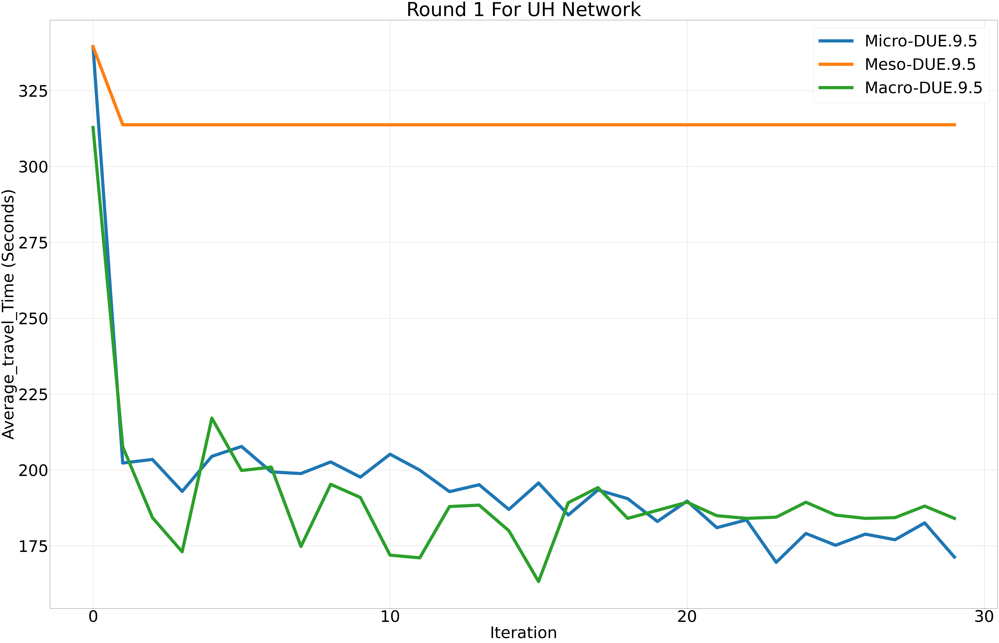

tests:  4corners_neighborhoods.net.xml-test-
Number of vehicles: -1
Micro-DUE.9.5
Average: 167.80066666666664
minimum: 154.365

Meso-DUE.9.5
Average: 272.03090000000003
minimum: 271.768

Macro-DUE.9.5
Average: 178.5315666666667
minimum: 163.426

tests:  4corners_neighborhoods.net.xml-test-


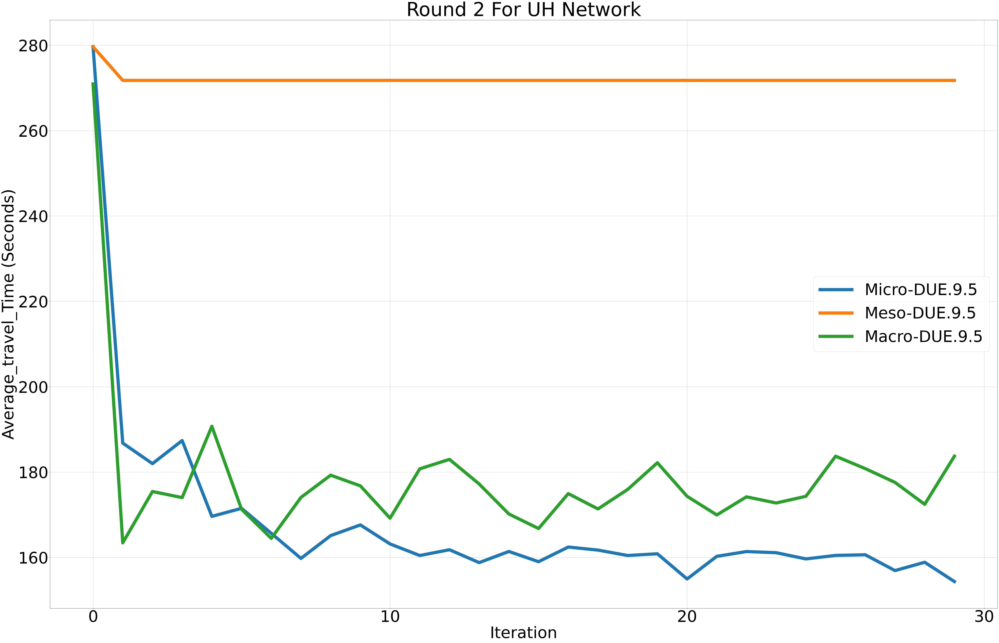

tests:  4corners_neighborhoods.net.xml-test-
Number of vehicles: -1
Micro-DUE.9.5
Average: 192.76646666666676
minimum: 168.657

Meso-DUE.9.5
Average: 309.2703999999998
minimum: 308.874

Macro-DUE.9.5
Average: 175.84953333333334
minimum: 160.714

tests:  4corners_neighborhoods.net.xml-test-


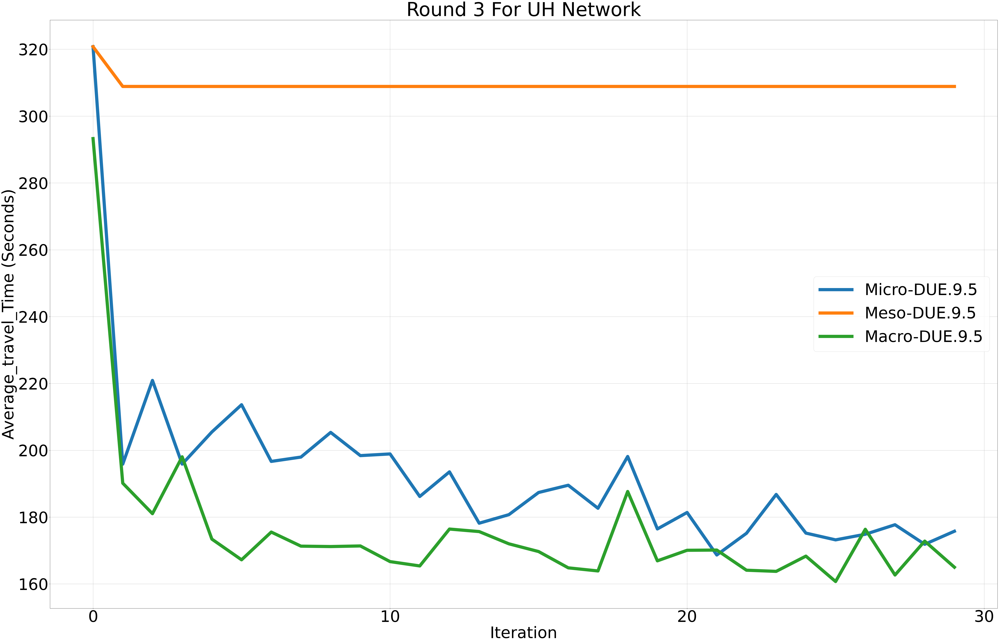

tests:  4corners_neighborhoods.net.xml-test-
Number of vehicles: -1
Micro-DUE.9.5
Average: 191.30563333333333
minimum: 173.027

Meso-DUE.9.5
Average: 292.1530666666666
minimum: 291.485

Macro-DUE.9.5
Average: 186.40806666666666
minimum: 173.93

tests:  4corners_neighborhoods.net.xml-test-


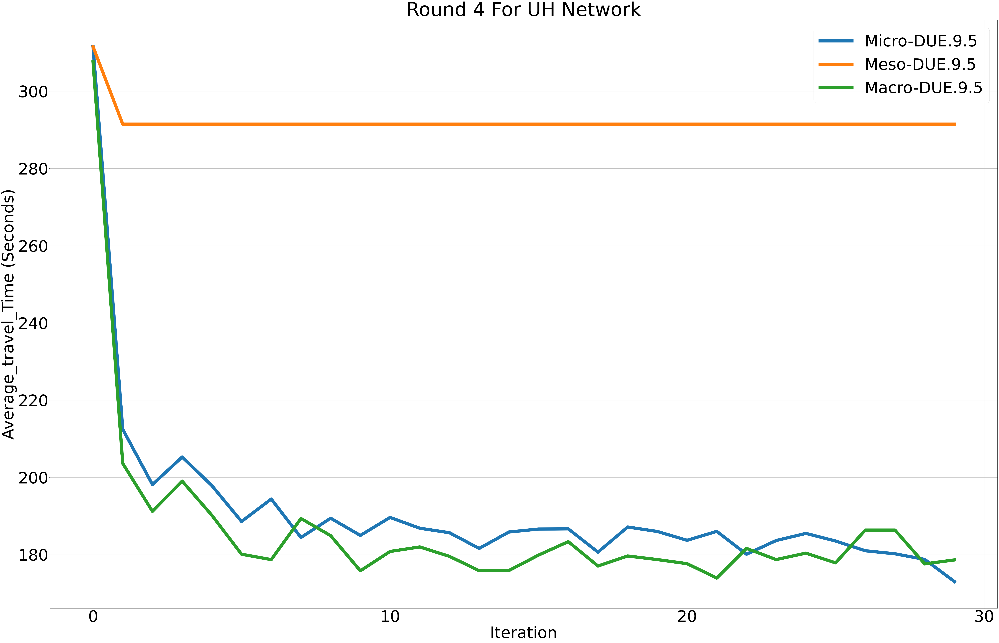

In [28]:
iterations = 30

for i in range(range_min,range_max):#number of tests
    print("tests: ",base_name)
    data_results = []
    for i3 in range(0,len(lst)):#number of models
        data_results.append([])
    cnt = 0
    Number_of_cars = -1
    try:
        Number_of_cars = df['Total_#_cars'].loc[(df['Version']=='STR_Fixed2-AD-Base')&(df['Round_name']==base_name + str(i)+"-Iteration-1")].values[0]
    except Exception:
        pass
    for i4 in lst:
        
        for i2 in range(0,iterations):#number of iterations.
            working_name_SE = base_name + str(i)+"-Iteration-" + str(i2)# remember with my method I start at 1
            working_name_DI = base_name + str(i)+"-Iteration-%03i"%i2
    #         print(working_name_SE)
    #         print(working_name_DI)
            x=df[criteria].loc[(df['Version']==i4)&(df['Round_name']==working_name_SE)]
            if len(x.values) > 0:
                #print(x.values[0]) 
                data_results[cnt].append(x.values[0])
        cnt+=1


    #print(np.arange(20))
    print("Number of vehicles:",Number_of_cars)
    plt.figure(figsize = (80,50))
    plt.rc('font', size=75) 
    plt.xlabel('Iteration')
    plt.ylabel(criteria+" (Seconds)")
    plt.title("Round "+str(i)+" For UH Network")
    #ex = [ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19]
    cnt = 0
    for i4 in lst:
        
        plt.plot(data_results[cnt],label=i4,linewidth = 15)
        print(i4)
        try:
            print("Average:",sum(data_results[cnt])/len(data_results[cnt]))
            print("minimum:",min(data_results[cnt]))
        except Exception:
            pass
        print()
        #plt.plot(data_results[1],label="DUE_verification-.05.3",linewidth = 7.5)
        cnt+=1
    print("tests: ",base_name)
    plt.xticks(np.arange(0,iterations+1,10), np.arange(0,iterations+1,10))
    plt.legend()
    plt.grid()
    plt.show()    
        #exit()
        #data_results[0].append()

In [29]:
base_name = 'Braess_Homebrew_fixed1.net.xml-test-'#'4corners_neighborhoods.net.xml-Long_test-'
#'4corners_neighborhoods.net.xml-Nu_test-'
#Braess_Homebrew_fixed.net.xml-Nu_test-'
#Braess_Homebrew_fixed.net.xml-Nu_test-
#data_results=[[0 for _ in range(4)]for _ in range(20)]
criteria = 'Average_travel_Time'#"Deadline Misses" # should literally be called criterion lmao
    
#SUMO Execute = SE, DI = duaIterate
#0 - SE DUE
#1 - SE DSO
#2 - DI DUE
#3 - DI DSO

lst = ['Micro-DUE.9.5', 'Meso-DUE.9.5', 'Macro-DUE.9.5']
range_min = 0
range_max = 5

tests:  Braess_Homebrew_fixed1.net.xml-test-
Number of vehicles: -1
Micro-DUE.9.5
Average: 136.07203333333334
minimum: 106.398

Meso-DUE.9.5
Average: 394.0682666666668
minimum: 106.398

Macro-DUE.9.5
Average: 378.3619666666666
minimum: 118.402

tests:  Braess_Homebrew_fixed1.net.xml-test-


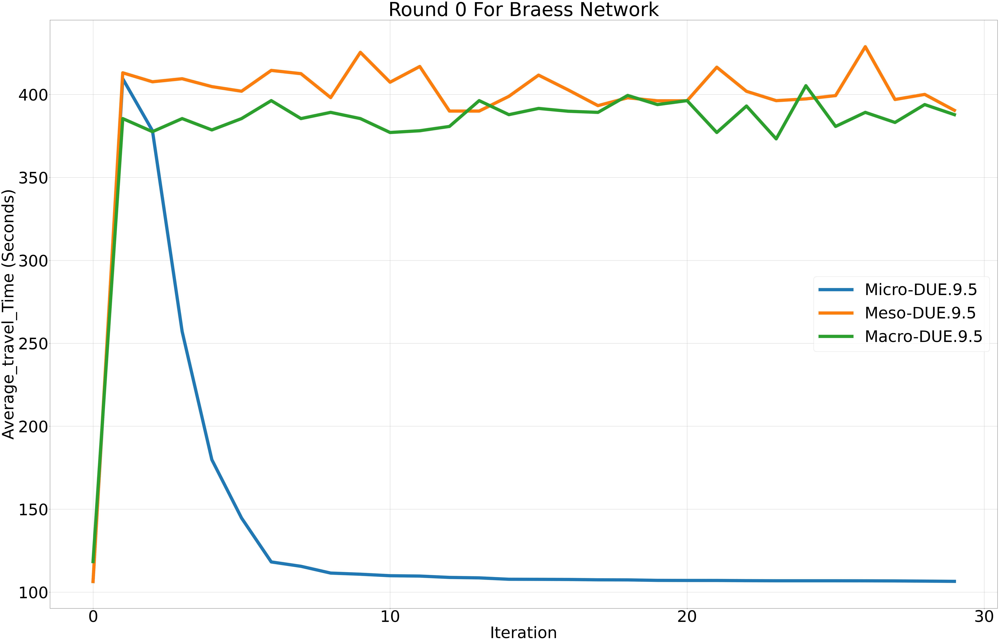

tests:  Braess_Homebrew_fixed1.net.xml-test-
Number of vehicles: -1
Micro-DUE.9.5
Average: 135.91873333333334
minimum: 106.398

Meso-DUE.9.5
Average: 393.5815
minimum: 106.398

Macro-DUE.9.5
Average: 378.44899999999996
minimum: 117.783

tests:  Braess_Homebrew_fixed1.net.xml-test-


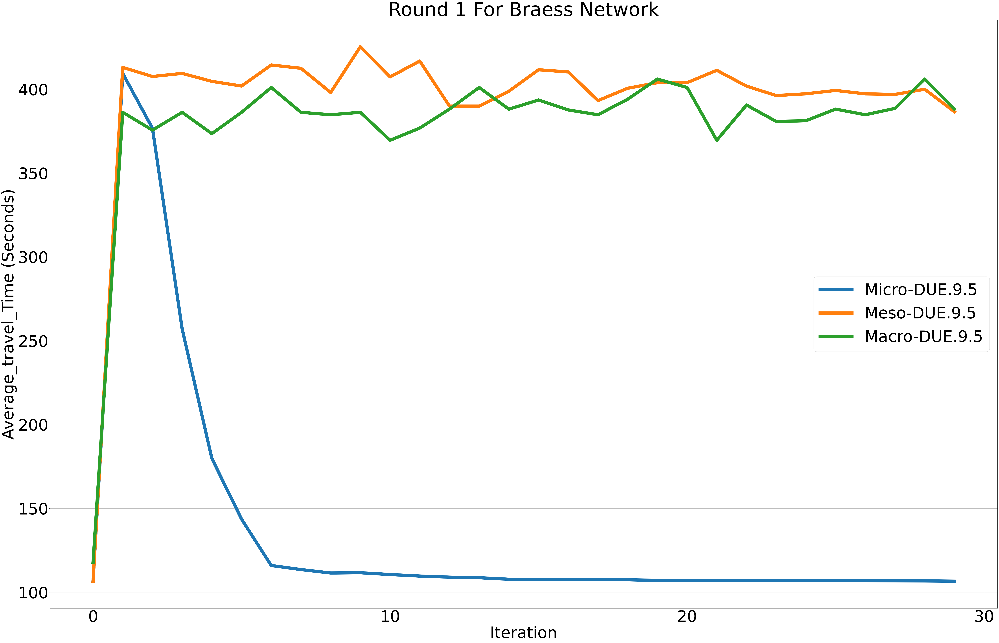

tests:  Braess_Homebrew_fixed1.net.xml-test-
Number of vehicles: -1
Micro-DUE.9.5
Average: 135.76673333333332
minimum: 106.398

Meso-DUE.9.5
Average: 393.64606666666674
minimum: 106.398

Macro-DUE.9.5
Average: 379.9131666666666
minimum: 118.206

tests:  Braess_Homebrew_fixed1.net.xml-test-


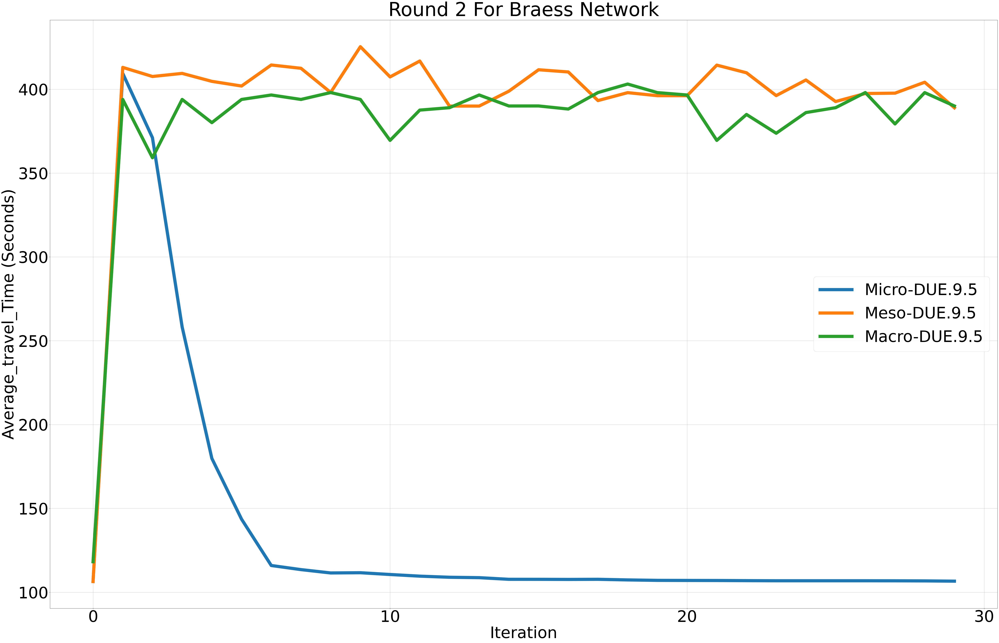

tests:  Braess_Homebrew_fixed1.net.xml-test-
Number of vehicles: -1
Micro-DUE.9.5
Average: 135.78213333333335
minimum: 106.398

Meso-DUE.9.5
Average: 394.0721666666667
minimum: 106.398

Macro-DUE.9.5
Average: 378.3619666666666
minimum: 118.402

tests:  Braess_Homebrew_fixed1.net.xml-test-


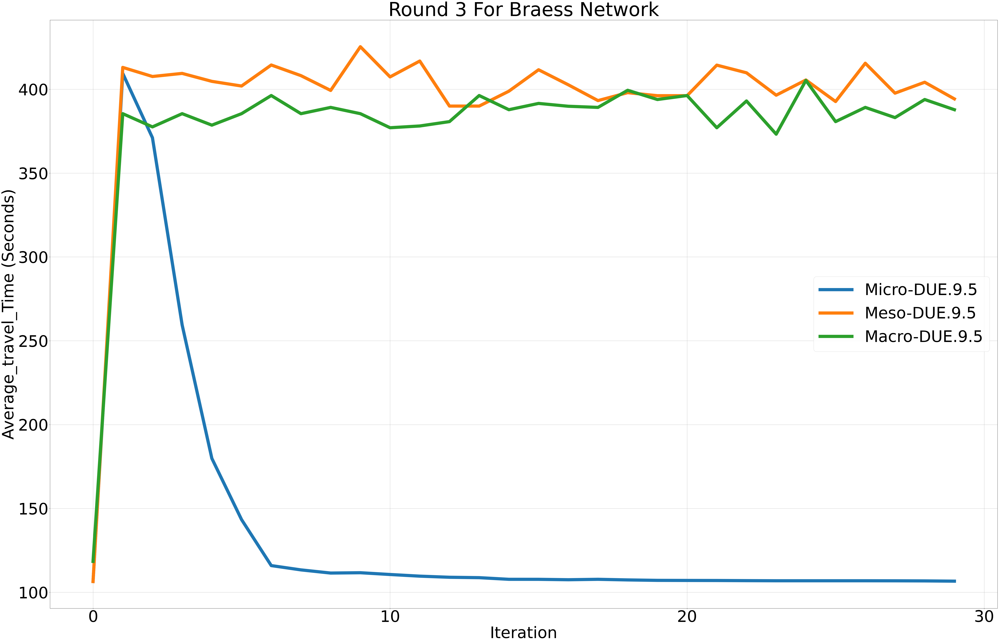

tests:  Braess_Homebrew_fixed1.net.xml-test-
Number of vehicles: -1
Micro-DUE.9.5
Average: 135.76163333333335
minimum: 106.398

Meso-DUE.9.5
Average: 393.7914
minimum: 106.398

Macro-DUE.9.5
Average: 379.5074
minimum: 118.252

tests:  Braess_Homebrew_fixed1.net.xml-test-


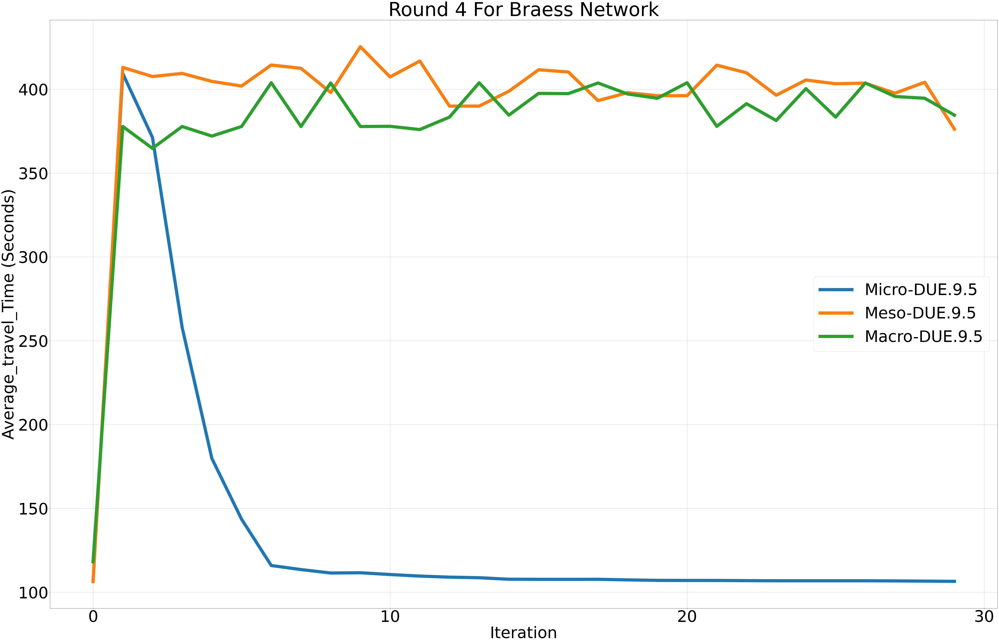

In [30]:
iterations = 30

for i in range(range_min,range_max):#number of tests
    print("tests: ",base_name)
    data_results = []
    for i3 in range(0,len(lst)):#number of models
        data_results.append([])
    cnt = 0
    Number_of_cars = -1
    try:
        Number_of_cars = df['Total_#_cars'].loc[(df['Version']=='STR_Fixed2-AD-Base')&(df['Round_name']==base_name + str(i)+"-Iteration-1")].values[0]
    except Exception:
        pass
    for i4 in lst:
        
        for i2 in range(0,iterations):#number of iterations.
            working_name_SE = base_name + str(i)+"-Iteration-" + str(i2)# remember with my method I start at 1
            working_name_DI = base_name + str(i)+"-Iteration-%03i"%i2
    #         print(working_name_SE)
    #         print(working_name_DI)
            x=df[criteria].loc[(df['Version']==i4)&(df['Round_name']==working_name_SE)]
            if len(x.values) > 0:
                #print(x.values[0]) 
                data_results[cnt].append(x.values[0])
        cnt+=1


    #print(np.arange(20))
    print("Number of vehicles:",Number_of_cars)
    plt.figure(figsize = (80,50))
    plt.rc('font', size=75) 
    plt.xlabel('Iteration')
    plt.ylabel(criteria+" (Seconds)")
    plt.title("Round "+str(i)+" For Braess Network")
    #ex = [ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19]
    cnt = 0
    for i4 in lst:
        
        plt.plot(data_results[cnt],label=i4,linewidth = 15)
        print(i4)
        try:
            print("Average:",sum(data_results[cnt])/len(data_results[cnt]))
            print("minimum:",min(data_results[cnt]))
        except Exception:
            pass
        print()
        #plt.plot(data_results[1],label="DUE_verification-.05.3",linewidth = 7.5)
        cnt+=1
    print("tests: ",base_name)
    plt.xticks(np.arange(0,iterations+1,10), np.arange(0,iterations+1,10))
    plt.legend()
    plt.grid()
    plt.show()    
        #exit()
        #data_results[0].append()

In [31]:
base_name = 'Random_English.net.xml-test_R-'
criteria = 'Average_travel_Time'
    
#SUMO Execute = SE, DI = duaIterate
#0 - SE DUE
#1 - SE DSO
#2 - DI DUE
#3 - DI DSO

lst = ['Micro-DUE.9.5', 'Meso-DUE.9.5', 'Macro-DUE.9.5']
range_min = 0
range_max = 5

tests:  Random_English.net.xml-test_R-
Number of vehicles: -1
Micro-DUE.9.5
Average: 178.7509333333333
minimum: 177.191

Meso-DUE.9.5
Average: 178.4252666666667
minimum: 177.735

Macro-DUE.9.5
Average: 178.0255666666667
minimum: 176.798

tests:  Random_English.net.xml-test_R-


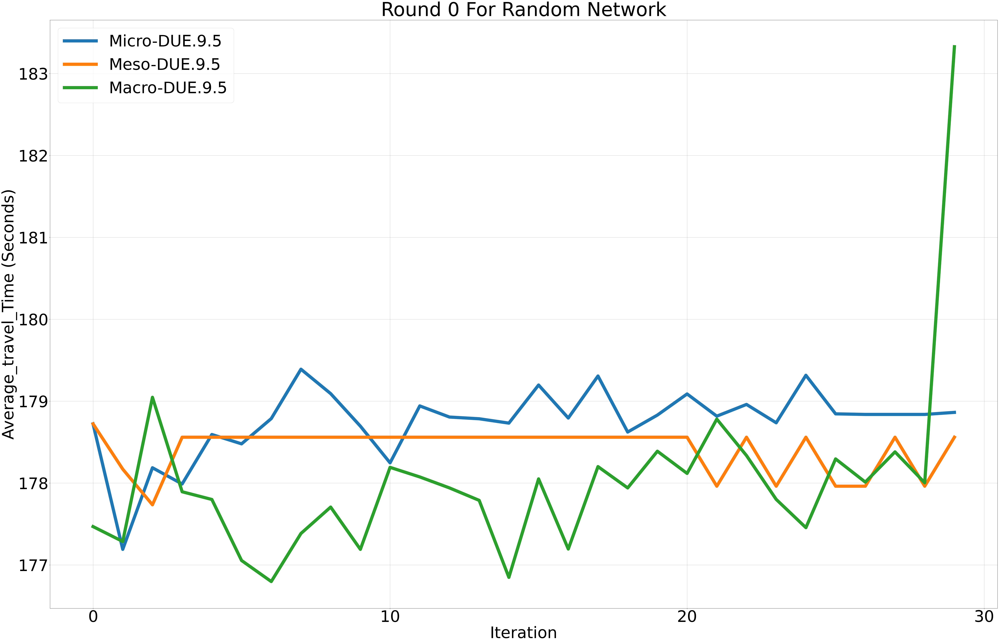

tests:  Random_English.net.xml-test_R-
Number of vehicles: -1
Micro-DUE.9.5
Average: 175.1014333333333
minimum: 173.383

Meso-DUE.9.5
Average: 174.48226666666682
minimum: 173.383

Macro-DUE.9.5
Average: 172.91866666666664
minimum: 171.501

tests:  Random_English.net.xml-test_R-


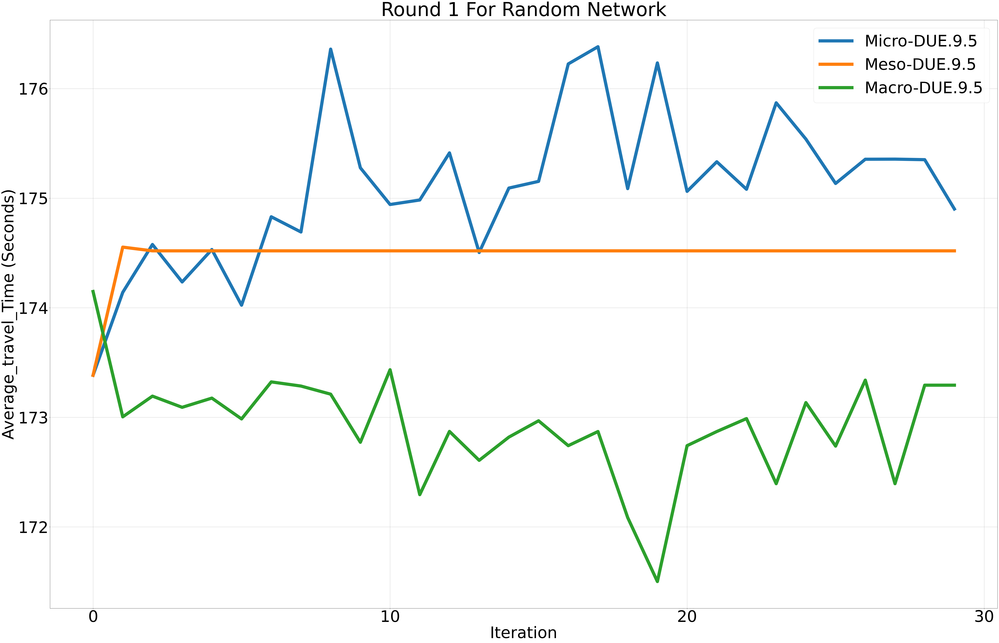

tests:  Random_English.net.xml-test_R-
Number of vehicles: -1
Micro-DUE.9.5
Average: 174.50626666666668
minimum: 173.608

Meso-DUE.9.5
Average: 175.26009999999994
minimum: 174.711

Macro-DUE.9.5
Average: 172.90016666666673
minimum: 172.225

tests:  Random_English.net.xml-test_R-


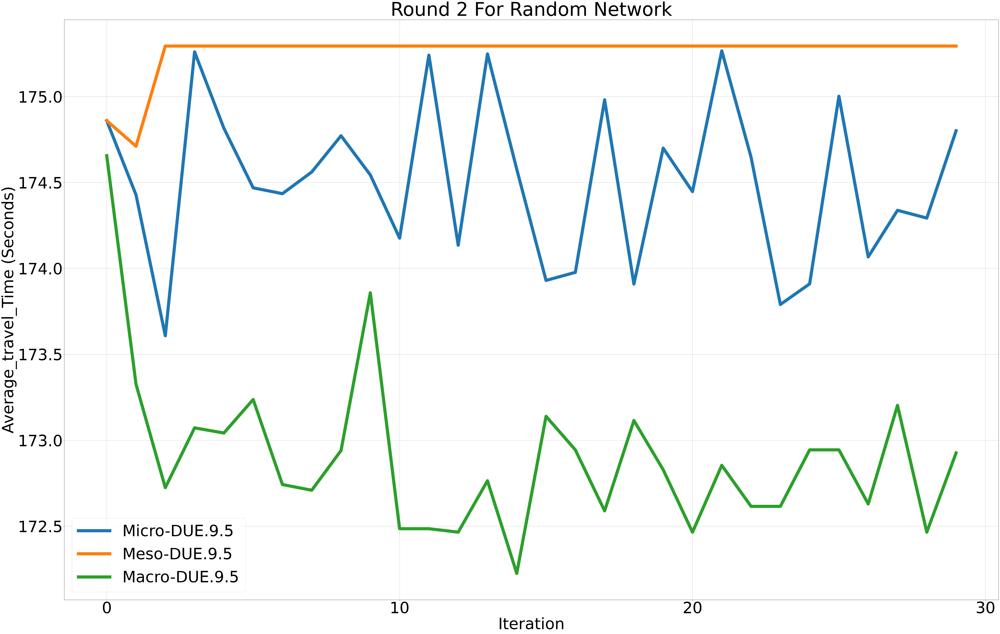

tests:  Random_English.net.xml-test_R-
Number of vehicles: -1
Micro-DUE.9.5
Average: 178.3893
minimum: 177.143

Meso-DUE.9.5
Average: 177.3799333333333
minimum: 177.063

Macro-DUE.9.5
Average: 177.3466333333334
minimum: 176.335

tests:  Random_English.net.xml-test_R-


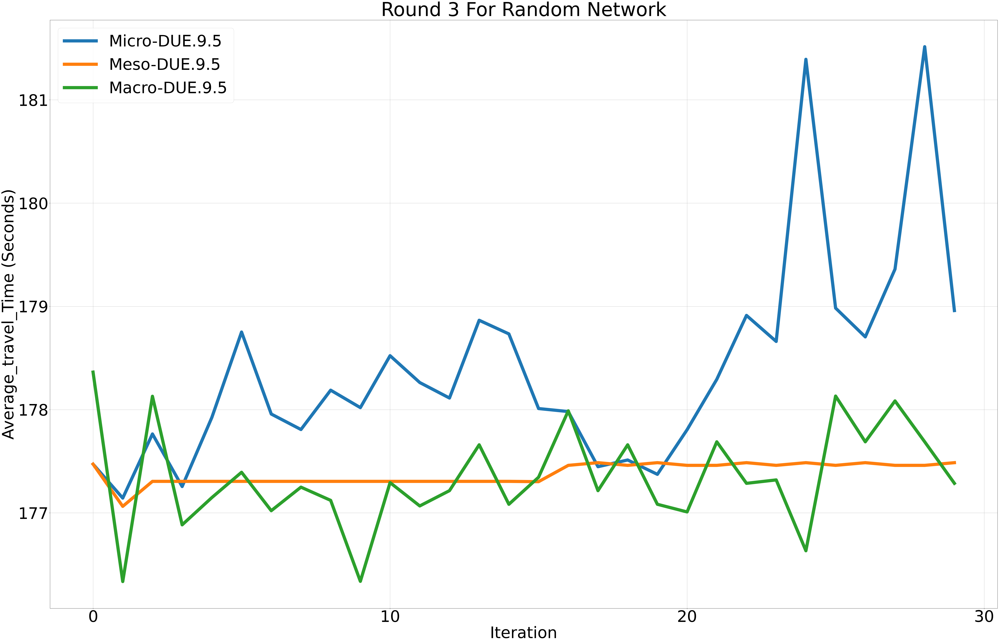

tests:  Random_English.net.xml-test_R-
Number of vehicles: -1
Micro-DUE.9.5
Average: 178.80123333333333
minimum: 177.529

Meso-DUE.9.5
Average: 178.6066999999999
minimum: 178.309

Macro-DUE.9.5
Average: 177.1267666666667
minimum: 176.289

tests:  Random_English.net.xml-test_R-


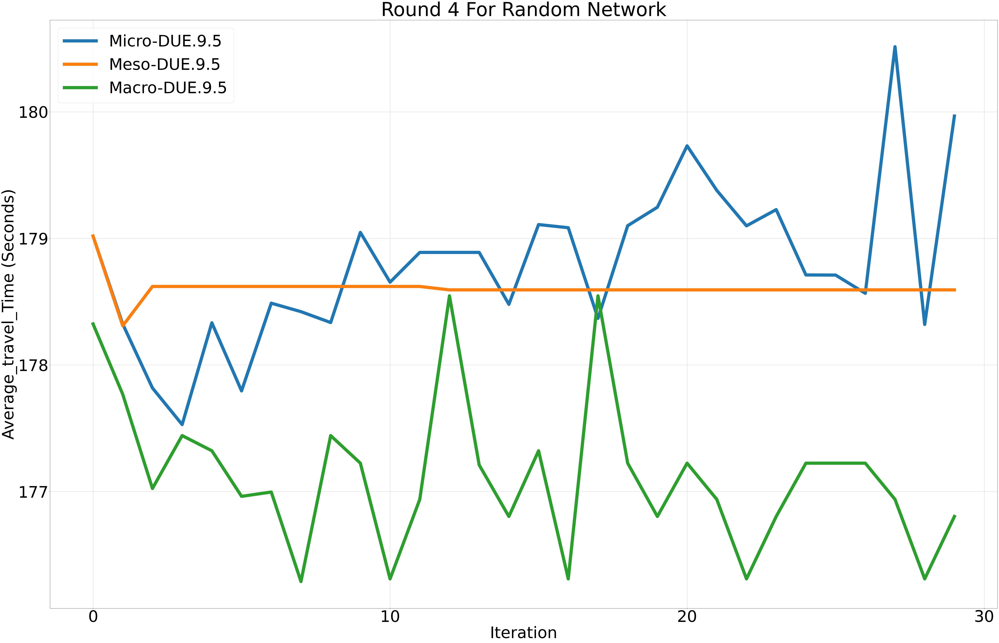

In [32]:
iterations = 30

for i in range(range_min,range_max):#number of tests
    print("tests: ",base_name)
    data_results = []
    for i3 in range(0,len(lst)):#number of models
        data_results.append([])
    cnt = 0
    Number_of_cars = -1
    try:
        Number_of_cars = df['Total_#_cars'].loc[(df['Version']=='STR_Fixed2-AD-Base')&(df['Round_name']==base_name + str(i)+"-Iteration-1")].values[0]
    except Exception:
        pass
    for i4 in lst:
        
        for i2 in range(0,iterations):#number of iterations.
            working_name_SE = base_name + str(i)+"-Iteration-" + str(i2)# remember with my method I start at 1
            working_name_DI = base_name + str(i)+"-Iteration-%03i"%i2
    #         print(working_name_SE)
    #         print(working_name_DI)
            x=df[criteria].loc[(df['Version']==i4)&(df['Round_name']==working_name_SE)]
            if len(x.values) > 0:
                #print(x.values[0]) 
                data_results[cnt].append(x.values[0])
        cnt+=1


    #print(np.arange(20))
    print("Number of vehicles:",Number_of_cars)
    plt.figure(figsize = (80,50))
    plt.rc('font', size=75) 
    plt.xlabel('Iteration')
    plt.ylabel(criteria+" (Seconds)")
    plt.title("Round "+str(i)+" For Random Network")
    #ex = [ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19]
    cnt = 0
    for i4 in lst:
        
        plt.plot(data_results[cnt],label=i4,linewidth = 15)
        print(i4)
        try:
            print("Average:",sum(data_results[cnt])/len(data_results[cnt]))
            print("minimum:",min(data_results[cnt]))
        except Exception:
            pass
        print()
        #plt.plot(data_results[1],label="DUE_verification-.05.3",linewidth = 7.5)
        cnt+=1
    print("tests: ",base_name)
    plt.xticks(np.arange(0,iterations+1,10), np.arange(0,iterations+1,10))
    plt.legend()
    plt.grid()
    plt.show()    
        #exit()
        #data_results[0].append()

# COSC6364_Project
 Code used to test Microscopic, Mesoscopic, and Macroscopic routing solutions of Simulation Of Urban MObility (SUMO) (https://github.com/eclipse/sumo).
 
 ## Contents
 
 ## Running Experiements:
 
 ### Requirements: 
 - Please run this Repository in Windows as this is the only OS I can gaurentee no errors for!!!
 - Please ensure all the requirements from the requirements.txt file are installed. You may use the command:
```
 pip3 install -r requirements.txt
```
- Afterward you will need to install SUMO and intialize SUMO_HOME as an environmental variable, the guides for which can be found here:

***Installing SUMO on Windows***
```
https://sumo.dlr.de/docs/Installing/index.html#windows
```

***SUMO_HOME on Wdin***
```
https://sumo.dlr.de/docs/Basics/Basic_Computer_Skills.html#sumo_home
```
 ## Acknowledgements
A Special thank you to Guangli Dai, Pavan Kumar Plarui, Thomas Carmichael, Albert M. K. Cheng and Risto Miikkulainen for their work on the original STR SUMO repository that this code is based on.
https://github.com/guangli-dai/Selfless-Traffic-Routing-Testbed

